In [1]:
using LinearAlgebra
dot2(x) = dot(x, x)
using Distributions
using StatsPlots
default(fmt=:png, titlefontsize=10, tickfontsize=6, guidefontsize=7)
using DataFrames
using RCall
using Random

データを生成するモデル:
$$
\begin{aligned}
& X_1 = U_1, \quad & & U_1 \sim \operatorname{Uniform}(-\sqrt{3}, \sqrt{3}) \\
& X_2 = X_1 + U_2, \quad & & U_2 \sim 10\operatorname{Uniform}(-\sqrt{3}, \sqrt{3}), \\
& Y = 1 + X_1 + X_1^2 + X_2 + U_3, \quad & & U_3 \sim \operatorname{Normal}(0, 1).
\end{aligned}
$$

推定用のモデル1:
$$
Y = \beta_0 + \beta_1 X_1 + \beta_2 X_2 + \sigma U, \quad U \sim \operatorname{Normal}(0, 1).
$$

推定用のモデル2
$$
Y = \beta_0 + \beta_1 X_1 + \beta_2 X_1^2 + \beta_3 X_2 + \sigma U, \quad U \sim \operatorname{Normal}(0, 1).
$$

[ Info: Saved animation to D:\OneDrive\public\0041\x1x2y.gif


Plots.AnimatedGif("D:\\OneDrive\\public\\0041\\x1x2y.gif")
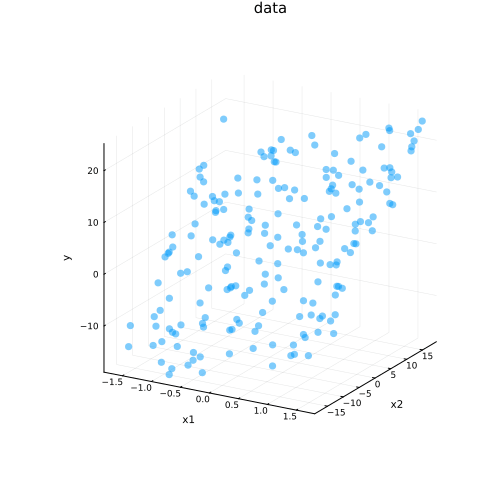

In [2]:
Random.seed!(4649373)

n = 200
x1 = rand(Uniform(-√3, √3), n)
x2 = x1 + 10rand(Uniform(-√3, √3), n)
y = @. 1 + x1 + x1^2 + x2 + randn()

anim = @animate for t in 0:3:359
    scatter(x1, x2, y; label="", title="data", msc=:auto, alpha=0.5, ms=4, camera=(t+30, 20))
    plot!(xguide="x1", yguide="x2", zguide="y")
    plot!(size=(500, 500))
end
gif(anim, "x1x2y.gif")

*** Y = β₀ + β₁X₁ + β₂X₂ + σU で推定 ***

(β̂0, β̂1, β̂2) = X \ y = [2.0805296016408015, 1.0698981224668458, 0.9929390487607191]
σ̂² = dot2(y - ŷ) / n = 2.1219383445917392

(α̂0, α̂1) = X1 \ y = [2.6108289936568054, 2.482048991843163]
dot2(y - ŷ1) / n = 92.2854097729551

(γ̂0, γ̂1) = X2 \ y = [2.1449427481741457, 1.009907495919126]
dot2(y - ŷ2) / n = 3.2893162305208907


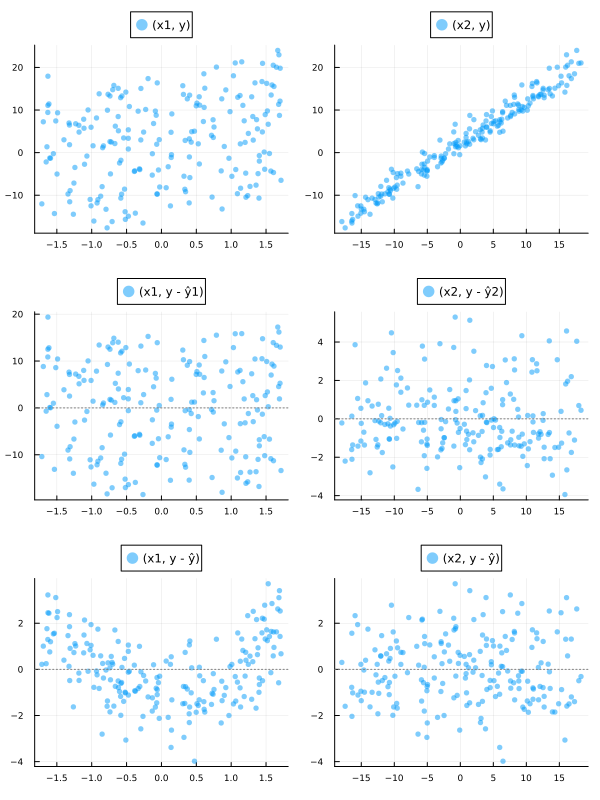

[ Info: Saved animation to D:\OneDrive\public\0041\reserr1.gif


Plots.AnimatedGif("D:\\OneDrive\\public\\0041\\reserr1.gif")
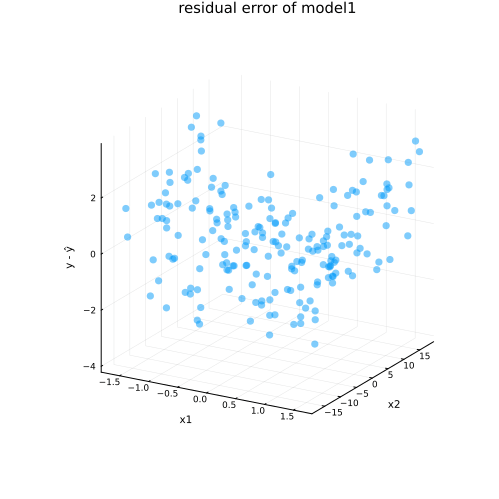

In [3]:
println("*** Y = β₀ + β₁X₁ + β₂X₂ + σU で推定 ***\n")
X = [ones(n) x1 x2]
@show β̂0, β̂1, β̂2 = X \ y
ŷ = @. β̂0 + β̂1*x1 + β̂2*x2
@show σ̂² = dot2(y - ŷ)/n
println()

X1 = [ones(n) x1]
@show α̂0, α̂1 = X1 \ y
ŷ1 = @. α̂0 + α̂1*x1
@show dot2(y - ŷ1)/n
println()

X2 = [ones(n) x2]
@show γ̂0, γ̂1 = X2 \ y
ŷ2 = @. γ̂0 + γ̂1*x2
@show dot2(y - ŷ2)/n

P1 = scatter(x1, y; label="(x1, y)", msc=:auto, alpha=0.5, ms=3)
P2 = scatter(x2, y; label="(x2, y)", msc=:auto, alpha=0.5, ms=3)

Q1 = scatter(x1, y - ŷ1; label="(x1, y - ŷ1)", msc=:auto, alpha=0.5, ms=3)
hline!([0]; label="", ls=:dot, c=:gray)
Q2 = scatter(x2, y - ŷ2; label="(x2, y - ŷ2)", msc=:auto, alpha=0.5, ms=3)
hline!([0]; label="", ls=:dot, c=:gray)

R1 = scatter(x1, y - ŷ; label="(x1, y - ŷ)", msc=:auto, alpha=0.5, ms=3)
hline!([0]; label="", ls=:dot, c=:gray)
R2 = scatter(x2, y - ŷ; label="(x2, y - ŷ)", msc=:auto, alpha=0.5, ms=3)
hline!([0]; label="", ls=:dot, c=:gray)

plot(P1, P2, Q1, Q2, R1, R2; size=(600, 800), layout=(3, 2))
plot!(legend=:outertop) |> display

anim = @animate for t in 0:3:359
    scatter(x1, x2, y - ŷ; label="", msc=:auto, alpha=0.5, ms=4, camera=(t+30, 20))
    plot!(xguide="x1", yguide="x2", zguide="y - ŷ")
    title!("residual error of model1")
    plot!(size=(500, 500))
end
gif(anim, "reserr1.gif")

*** Y = β₀ + β₁X₁ + β₂X₁² + β₃X₂ + σU で推定 ***

(β̂0, β̂1, β̂2, β̂3) = X \ y = [0.9824522974365433, 0.9122816627647206, 1.059570555760355, 0.9904251625961619]
ŝ² = dot2(y - ŷ) / (n - 4) = 1.2320589810198443

(α̂0, α̂1, α̂2) = X1 \ y = [1.2378516907312132, 2.2807496215565846, 1.3232126583800419]
dot2(y - ŷ1) / n = 90.85826719626886

(γ̂0, γ̂1) = X2 \ y = [2.1449427481741457, 1.009907495919126]
dot2(y - ŷ2) / n = 3.2893162305208907


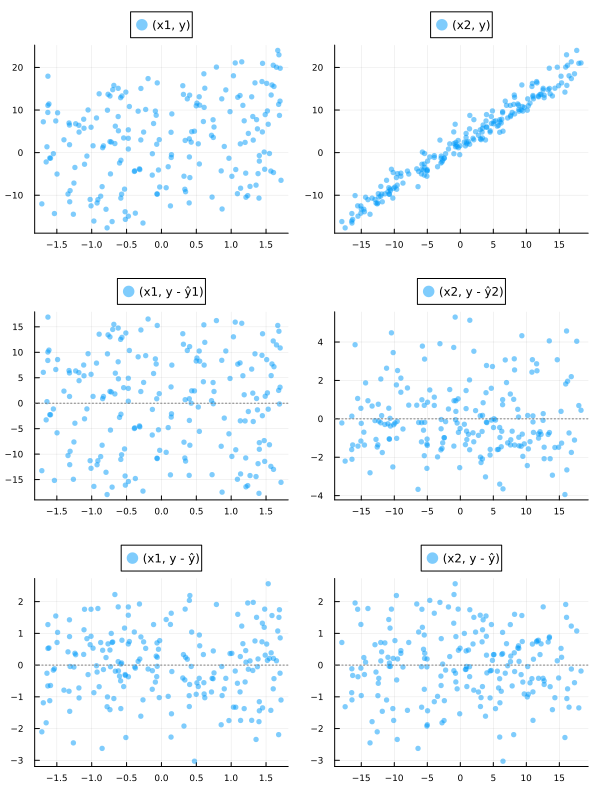

[ Info: Saved animation to D:\OneDrive\public\0041\reserr2.gif


Plots.AnimatedGif("D:\\OneDrive\\public\\0041\\reserr2.gif")
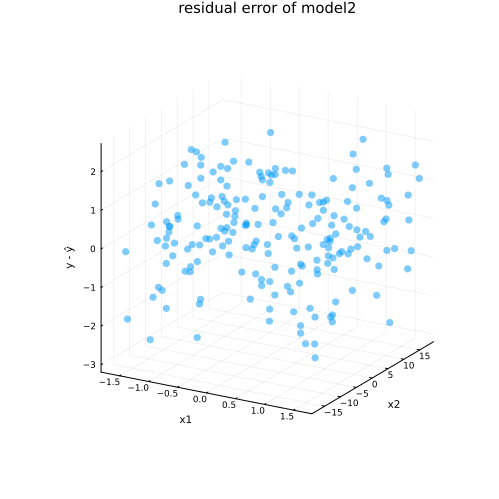

In [4]:
println("*** Y = β₀ + β₁X₁ + β₂X₁² + β₃X₂ + σU で推定 ***\n")

X = [ones(n) x1 @.(x1^2) x2]
@show β̂0, β̂1, β̂2, β̂3 = X \ y
ŷ = @. β̂0 + β̂1*x1 + β̂2*x1^2 + β̂3*x2
@show ŝ² = dot2(y - ŷ)/(n-4)
println()

X1 = [ones(n) x1 @.(x1^2)]
@show α̂0, α̂1, α̂2 = X1 \ y
ŷ1 = @. α̂0 + α̂1*x1 + α̂2*x1^2
@show dot2(y - ŷ1)/n
println()

X2 = [ones(n) x2]
@show γ̂0, γ̂1 = X2 \ y
ŷ2 = @. γ̂0 + γ̂1*x2
@show dot2(y - ŷ2)/n

P1 = scatter(x1, y; label="(x1, y)", msc=:auto, alpha=0.5, ms=3)
P2 = scatter(x2, y; label="(x2, y)", msc=:auto, alpha=0.5, ms=3)

Q1 = scatter(x1, y - ŷ1; label="(x1, y - ŷ1)", msc=:auto, alpha=0.5, ms=3)
hline!([0]; label="", ls=:dot, c=:gray)
Q2 = scatter(x2, y - ŷ2; label="(x2, y - ŷ2)", msc=:auto, alpha=0.5, ms=3)
hline!([0]; label="", ls=:dot, c=:gray)

R1 = scatter(x1, y - ŷ; label="(x1, y - ŷ)", msc=:auto, alpha=0.5, ms=3)
hline!([0]; label="", ls=:dot, c=:gray)
R2 = scatter(x2, y - ŷ; label="(x2, y - ŷ)", msc=:auto, alpha=0.5, ms=3)
hline!([0]; label="", ls=:dot, c=:gray)

plot(P1, P2, Q1, Q2, R1, R2; size=(600, 800), layout=(3, 2))
plot!(legend=:outertop) |> display

anim = @animate for t in 0:3:359
    scatter(x1, x2, y - ŷ; label="", msc=:auto, alpha=0.5, ms=4, camera=(t+30, 20))
    plot!(xguide="x1", yguide="x2", zguide="y - ŷ")
    title!("residual error of model2")
    plot!(size=(500, 500))
end
gif(anim, "reserr2.gif")

In [5]:
R"""
library(dplyr)
library(ggplot2)
"""

┌ Warning: RCall.jl: 
│ Attaching package: 'dplyr'
│ 
│ The following objects are masked from 'package:stats':
│ 
│     filter, lag
│ 
│ The following objects are masked from 'package:base':
│ 
│     intersect, setdiff, setequal, union
│ 
└ @ RCall D:\.julia\packages\RCall\Wyd74\src\io.jl:172


RObject{StrSxp}
[1] "ggplot2"   "dplyr"     "stats"     "graphics"  "grDevices" "utils"    
[7] "datasets"  "methods"   "base"     


In [6]:
df = DataFrame(y=y, x1=x1, x12=@.(x1^2), x2=x2)
@rput df

Row,y,x1,x12,x2
,Float64,Float64,Float64,Float64
1,10.6188,0.61245,0.375095,9.68265
2,1.15061,-0.843097,0.710813,-0.285675
3,2.05124,1.13112,1.27943,-1.6024
4,-16.0692,-0.968672,0.938325,-16.4504
5,-2.73482,-1.10304,1.2167,-5.81436
6,4.81747,-1.1812,1.39522,4.51243
7,-0.487496,0.143991,0.0207334,-0.0894901
8,20.0512,1.64959,2.72116,14.6849
9,3.3603,-0.475439,0.226043,1.92488


In [7]:
R"""
model1 = lm(y ~ x1 + x2, data = df)
"""

RObject{VecSxp}

Call:
lm(formula = y ~ x1 + x2, data = df)

Coefficients:
(Intercept)           x1           x2  
     2.0805       1.0699       0.9929  



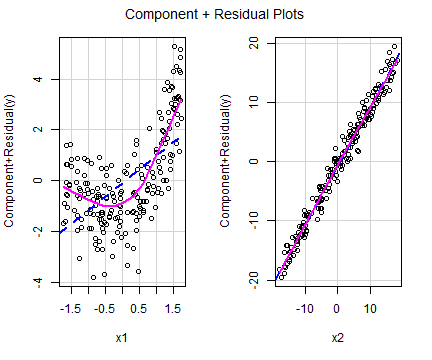

In [8]:
R"""
car::crPlots(model1)
""";

In [9]:
R"""
model2 = lm(y ~ x1 + x12 + x2, data = df)
"""

RObject{VecSxp}

Call:
lm(formula = y ~ x1 + x12 + x2, data = df)

Coefficients:
(Intercept)           x1          x12           x2  
     0.9825       0.9123       1.0596       0.9904  



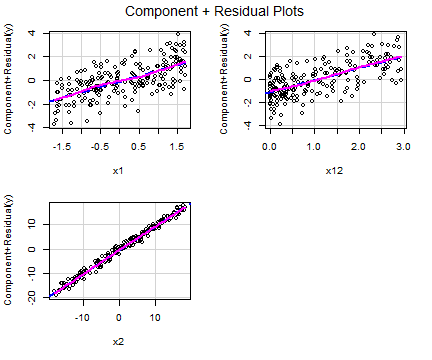

In [10]:
R"""
car::crPlots(model2)
""";

https://twitter.com/NorimitsuNishi1/status/1626514396112650240

In [11]:
R"""
set.seed(2349)
n <- 40
d <- tibble(x1 = runif(n, 3, 8), x2 = runif(n, 1, 5),
    epsilon = rnorm(n, 0, 0.3)) |>
    mutate(y = 10 + (4*x1) + (1 * x2^2) + epsilon)
"""
@rget d
y = @. 10 + (4*d.x1) + (1 * d.x2^2) + d.epsilon
@show y == d.y
d.x22 = @. d.x2^2
@rput d

y == d.y = true


Row,x1,x2,epsilon,y,x22
,Float64,Float64,Float64,Float64,Float64
1,3.32674,2.63476,-0.418197,29.8307,6.94197
2,5.20507,4.89762,-0.0132167,54.7937,23.9867
3,4.76014,4.32701,0.368414,48.132,18.723
4,5.37763,3.63512,-0.294085,44.4305,13.2141
5,6.54104,4.45858,0.00865288,56.0517,19.8789
6,4.16001,4.63996,-0.122812,48.0465,21.5292
7,7.43478,4.41026,0.163803,59.3533,19.4504
8,4.14636,3.11266,-0.271684,36.0024,9.68862
9,7.89757,2.54164,-0.130827,47.9194,6.45992


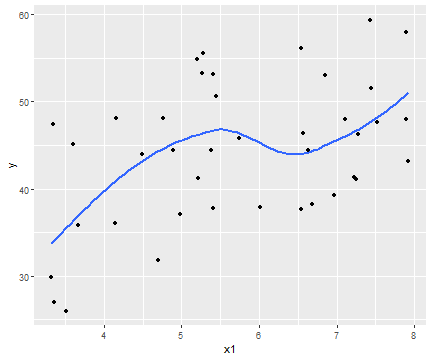

RObject{VecSxp}
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'


In [12]:
R"""
ggplot(d) + geom_point(aes(x = x1, y = y)) +
geom_smooth(aes(x=x1, y=y), se=FALSE)
"""

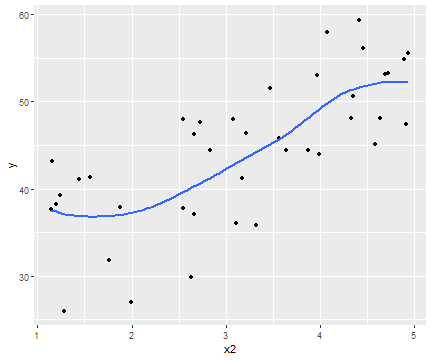

RObject{VecSxp}
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'


In [13]:
R"""
ggplot(d) + geom_point(aes(x = x2, y = y)) +
geom_smooth(aes(x=x2, y=y), se=FALSE)
"""

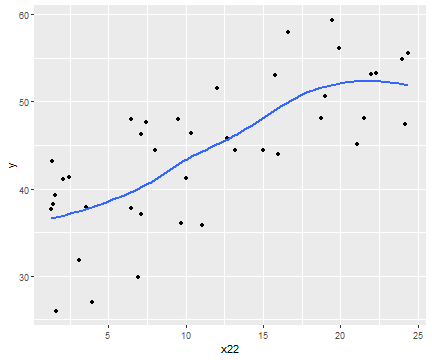

RObject{VecSxp}
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'


In [14]:
R"""
ggplot(d) + geom_point(aes(x = x22, y = y)) +
geom_smooth(aes(x=x22, y=y), se=FALSE)
"""

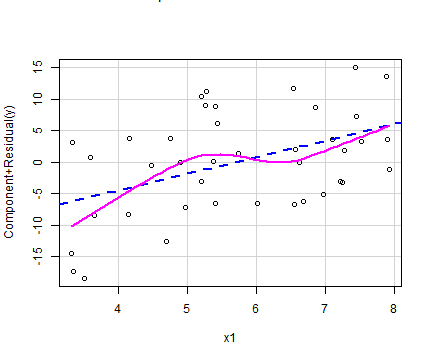

RObject{RealSxp}
[1] 0


In [15]:

R"""
model = lm(y ~ x1, data = d)
car::crPlots(model)
"""

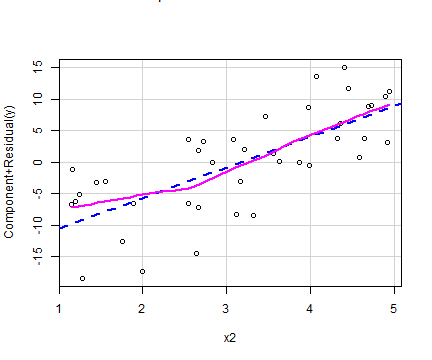

RObject{RealSxp}
[1] 0


In [16]:
R"""
model = lm(y ~ x2, data = d)
car::crPlots(model)
"""

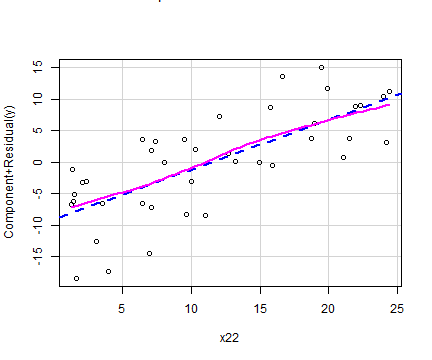

RObject{RealSxp}
[1] 0


In [17]:
R"""
model = lm(y ~ x22, data = d)
car::crPlots(model)
"""

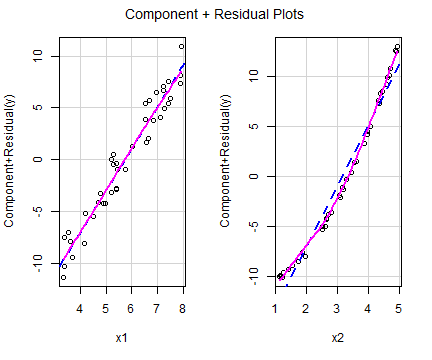

RObject{RealSxp}
[1] 0


In [18]:
R"""
model = lm(y ~ x1 + x2, data = d)
car::crPlots(model)
"""

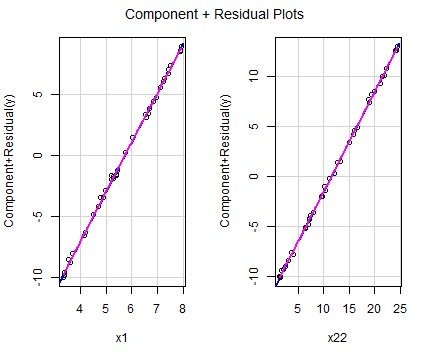

RObject{RealSxp}
[1] 0


In [19]:
R"""
model = lm(y ~ x1 + x22, data = d)
car::crPlots(model)
"""

[ Info: Saved animation to D:\OneDrive\public\0041\d_x1x2y.gif


Plots.AnimatedGif("D:\\OneDrive\\public\\0041\\d_x1x2y.gif")
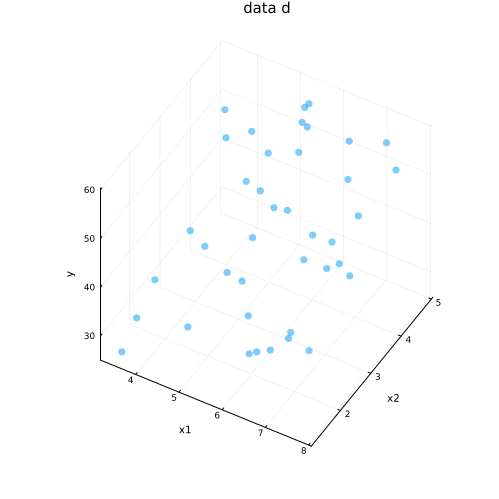

In [20]:
R"""
set.seed(2349)
n <- 40
d <- tibble(x1 = runif(n, 3, 8), x2 = runif(n, 1, 5),
    epsilon = rnorm(n, 0, 0.3)) |>
    mutate(y = 10 + (4*x1) + (1 * x2^2) + epsilon)
"""

n = size(d, 1)
(; x1, x2, y) = d

anim = @animate for t in 0:3:359
    scatter(x1, x2, y; label="", title="data d", msc=:auto, alpha=0.5, ms=4, camera=(t+30, 45))
    plot!(xguide="x1", yguide="x2", zguide="y")
    plot!(size=(500, 500))
end
gif(anim, "d_x1x2y.gif")

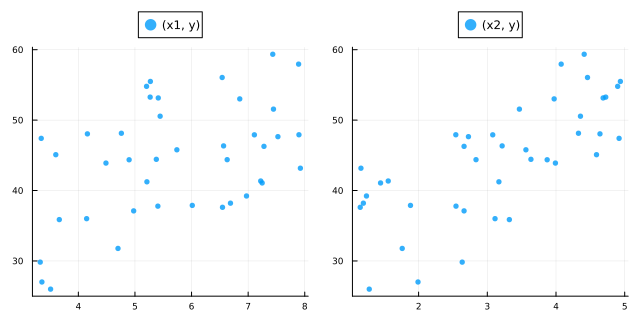

In [21]:
n = size(d, 1)
(; x1, x2, y) = d

P1 = scatter(x1, y; label="(x1, y)", msc=:auto, alpha=0.8, ms=3)
P2 = scatter(x2, y; label="(x2, y)", msc=:auto, alpha=0.8, ms=3)

plot(P1, P2; size=(640, 320), legend=:outertop)

b1 = X1 \ y = [2.58588487152423, 3.961611763345443, 6.023107344726137]
s1 = 1.3856451003876167


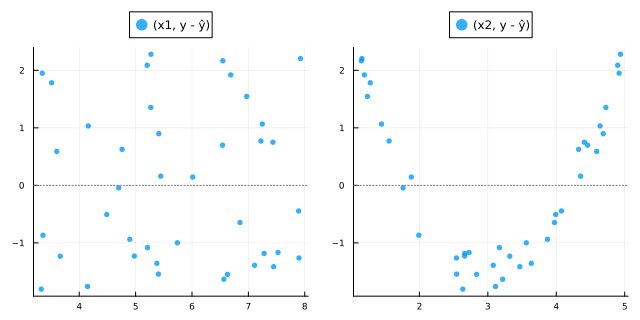

In [22]:
# y ~ b0 + b1*x1 + b2*x2 + u で推定

n = size(d, 1)
(; x1, x2, y) = d
X1 = [ones(n) x1 x2]

@show b1 = X1 \ y

ŷ = @. b1[1] + b1[2]*x1 + b1[3]*x2

s1 = √(dot2(y - ŷ)/(n-3))
@show s1

R1 = scatter(x1, y - ŷ; label="(x1, y - ŷ)", msc=:auto, alpha=0.8, ms=3)
hline!([0]; label="", ls=:dot, c=:gray)
R2 = scatter(x2, y - ŷ; label="(x2, y - ŷ)", msc=:auto, alpha=0.8, ms=3)
hline!([0]; label="", ls=:dot, c=:gray)

plot(R1, R2; size=(640, 320), legend=:outertop)

b_true = [10.0, 4.0, 1.0]
b2 = X2 \ y = [9.89671370166131, 4.016392790302971, 0.9954517272480783]
σ_true = 0.3
s2 = 0.21702468934314711


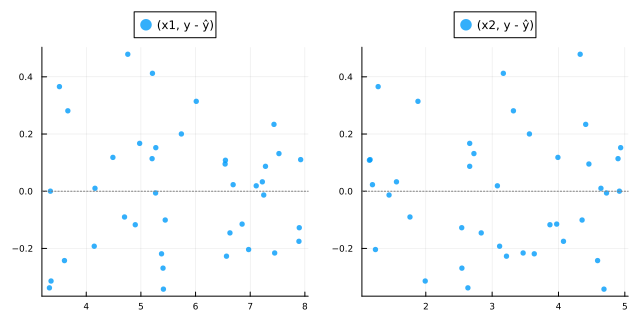

In [23]:
# y ~ b0 + b1*x1 + b2*x2^2 + u で推定

n = size(d, 1)
(; x1, x2, y) = d
X2 = [ones(n) x1 @.(x2^2)]

b_true = Float64[10, 4, 1]
@show b_true
@show b2 = X2 \ y

ŷ = @. b2[1] + b2[2]*x1 + b2[3]*x2^2

σ_true = 0.3
s2 = √(dot2(y - ŷ)/(n-3))
@show σ_true
@show s2

R1 = scatter(x1, y - ŷ; label="(x1, y - ŷ)", msc=:auto, alpha=0.8, ms=3)
hline!([0]; label="", ls=:dot, c=:gray)
R2 = scatter(x2, y - ŷ; label="(x2, y - ŷ)", msc=:auto, alpha=0.8, ms=3)
hline!([0]; label="", ls=:dot, c=:gray)

plot(R1, R2; size=(640, 320), legend=:outertop)

b_true = [10.0, 4.0, 0.0, 1.0]
b3 = X3 \ y = [10.089844214408748, 4.016601791974586, -0.14628537881631815, 1.0188334965236832]
σ_true = 0.3
s3 = 0.2176234869505348


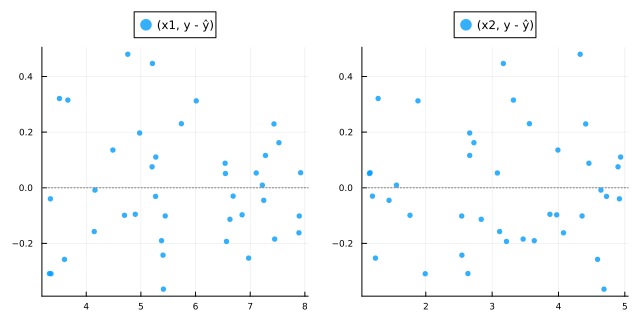

In [24]:
# y ~ b0 + b1*x1 + b2*x2 + b3*x2^2 + u で推定

n = size(d, 1)
(; x1, x2, y) = d
X3 = [ones(n) x1 x2 @.(x2^2)]

b_true = Float64[10, 4, 0, 1]
@show b_true
@show b3 = X3 \ y

ŷ = @. b3[1] + b3[2]*x1 + b3[3]*x2 + b3[4]*x2^2

σ_true = 0.3
s3 = √(dot2(y - ŷ)/(n-4))
@show σ_true
@show s3

R1 = scatter(x1, y - ŷ; label="(x1, y - ŷ)", msc=:auto, alpha=0.8, ms=3)
hline!([0]; label="", ls=:dot, c=:gray)
R2 = scatter(x2, y - ŷ; label="(x2, y - ŷ)", msc=:auto, alpha=0.8, ms=3)
hline!([0]; label="", ls=:dot, c=:gray)

plot(R1, R2; size=(640, 320), legend=:outertop)